# Stereo Vision

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

## 1. Block Matching

In [14]:
def block_matching(left, right, window_size=5, mode='SAD', max_disparity=32):
    
    height, width = left.shape[:2]
    disparity_map = np.zeros((height, width))
    left_padded = np.pad(left, pad_width=window_size // 2, mode='constant', constant_values=0)
    right_padded = np.pad(right, pad_width=window_size // 2, mode='constant', constant_values=0)
    
    for row in range(window_size//2,height):
        for col in range(window_size//2,width):
            window1 = left_padded[row-window_size//2:row + window_size//2 +1, col-window_size//2:col + window_size//2 +1]
            
            # Initialize minimum cost and best disparity
            min_cost = float('inf')
            best_disparity = 0
            
            for disp in range(max_disparity):
                if col-disp-window_size//2>=0:
                    
                    window2 = right_padded[row-window_size//2 : row+window_size//2 +1, col-disp-window_size//2 : col-disp+window_size//2 +1]

                    # Compute matching cost based on the specified mode
                    if mode == 'SSD':
                        cost = np.sum((window1.astype('float') - window2.astype('float')) ** 2)
                    elif mode == 'SAD':
                        cost = np.sum(np.abs(window1.astype('float') - window2.astype('float')))
                    else:
                        raise ValueError("Invalid mode. Supported modes are 'SSD' and 'SAD'.")

                    # Update best disparity if the current cost is lower
                    if cost < min_cost:
                        min_cost = cost
                        best_disparity = disp
                        
                ''' if col+disp+window_size//2<=width:
                    
                    window2 = right_padded[row-window_size//2 : row+window_size//2 +1, col+disp-window_size//2 : col+disp+window_size//2 +1]

                    # Compute matching cost based on the specified mode
                    if mode == 'SSD':
                        cost = np.sum((window1.astype('float') - window2.astype('float')) ** 2)
                    elif mode == 'SAD':
                        cost = np.sum(np.abs(window1.astype('float') - window2.astype('float')))
                    else:
                        raise ValueError("Invalid mode. Supported modes are 'SSD' and 'SAD'.")

                    # Update best disparity if the current cost is lower
                    if cost < min_cost:
                        min_cost = cost
                        best_disparity = disp'''
    
            # Assign the best disparity to the disparity map
            disparity_map[row, col] = best_disparity
    
    return disparity_map

            

In [7]:
def load_original(path_left,path_right):
    left = cv2.imread(path_left)
    left = cv2.cvtColor(left,cv2.COLOR_BGR2RGB)
    
    right = cv2.imread(path_right)
    right = cv2.cvtColor(right,cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    plt.imshow(left)
    plt.title('Left Image')
    plt.subplot(1, 2, 2)
    plt.imshow(right)
    plt.title('Right Image')
    plt.show()
    
    return cv2.cvtColor(left,cv2.COLOR_RGB2GRAY),cv2.cvtColor(right,cv2.COLOR_RGB2GRAY)
    

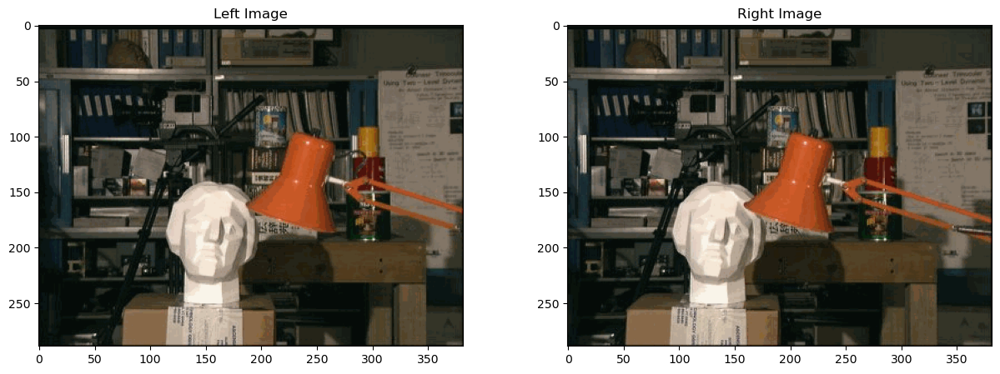

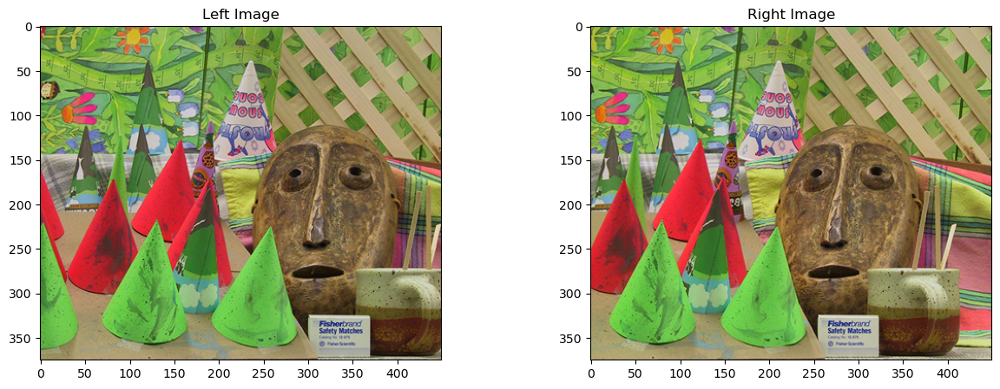

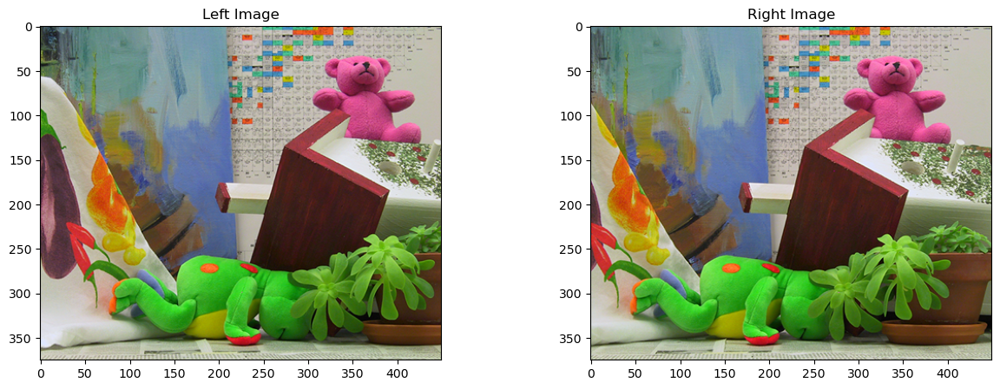

In [8]:
left1,right1 = load_original('Stereo material/l1.png','Stereo material/r1.png')
left2,right2 = load_original('Stereo material/l2.png','Stereo material/r2.png')
left3,right3 = load_original('Stereo material/l3.png','Stereo material/r3.png')



In [ ]:
def plot_maps(map1,map2,map3,mode,window_size):
    plt.figure(figsize=(18,5))
    plt.suptitle(f'{mode} Window Size = {window_size}')

    plt.subplot(1, 3, 1)
    plt.imshow(map1)
    plt.title('Image 1')

    plt.subplot(1, 3, 2)
    plt.imshow(map2)
    plt.title('Image 2')

    plt.subplot(1, 3, 3)
    plt.imshow(map3)
    plt.title('Image 3')
    plt.show()

In [25]:
map1 = block_matching(left1,right1,mode='SAD')
map2 = block_matching(left2,right2,mode='SAD')
map3 = block_matching(left3,right3,mode='SAD')

map11 = block_matching(left1,right1,mode='SSD')
map22 = block_matching(left2,right2,mode='SSD')
map33 = block_matching(left3,right3,mode='SSD')

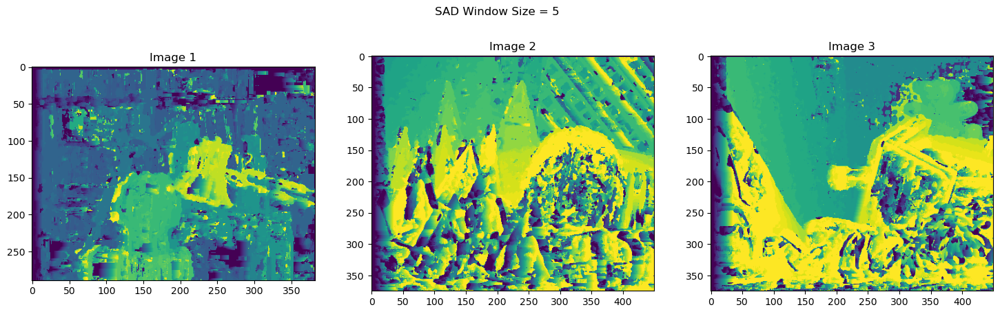

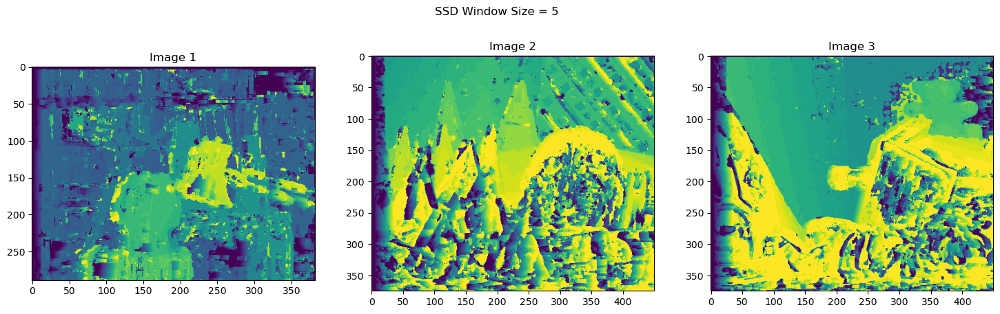

In [26]:
plot_maps(map1,map2,map3,'SAD',5)
plot_maps(map11,map22,map33,'SSD',5)

In [22]:
map1 = block_matching(left1,right1,mode='SAD',window_size=1)
map2 = block_matching(left2,right2,mode='SAD',window_size=1)
map3 = block_matching(left3,right3,mode='SAD',window_size=1)

map11 = block_matching(left1,right1,mode='SSD',window_size=1)
map22 = block_matching(left2,right2,mode='SSD',window_size=1)
map33 = block_matching(left3,right3,mode='SSD',window_size=1)

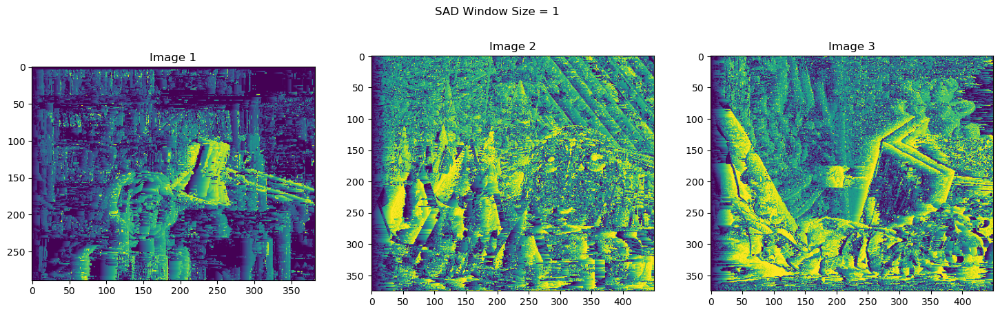

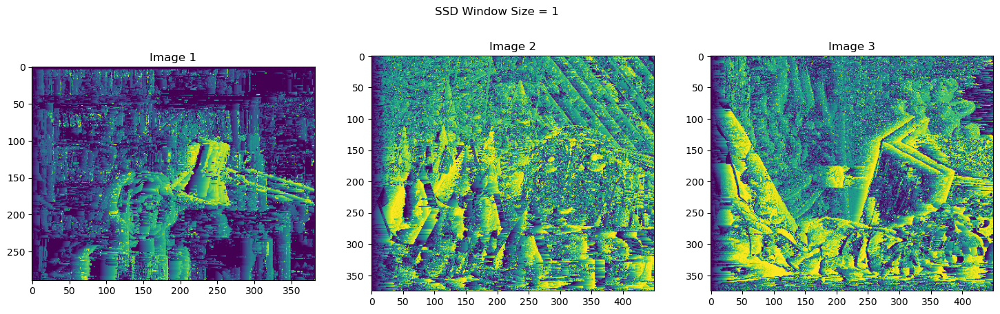

In [24]:
plot_maps(map1,map2,map3,'SAD',1)
plot_maps(map11,map22,map33,'SSD',1)

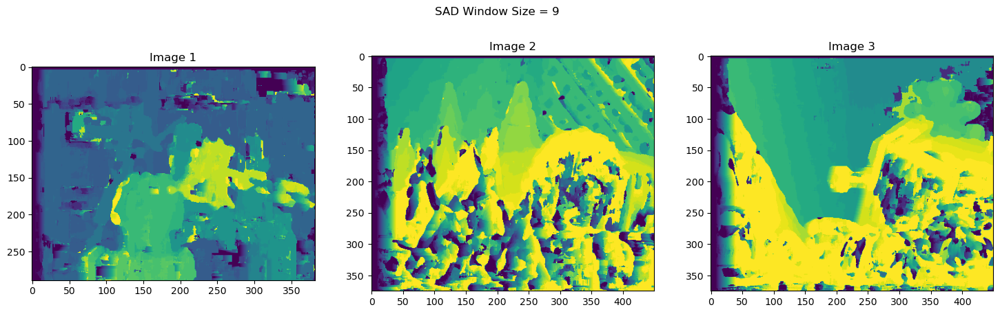

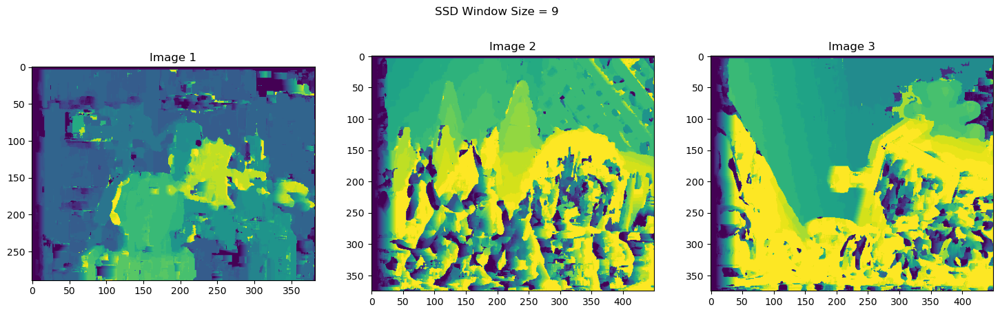

In [27]:
map1 = block_matching(left1,right1,mode='SAD',window_size=9)
map2 = block_matching(left2,right2,mode='SAD',window_size=9)
map3 = block_matching(left3,right3,mode='SAD',window_size=9)

map11 = block_matching(left1,right1,mode='SSD',window_size=9)
map22 = block_matching(left2,right2,mode='SSD',window_size=9)
map33 = block_matching(left3,right3,mode='SSD',window_size=9)

plot_maps(map1,map2,map3,'SAD',9)
plot_maps(map11,map22,map33,'SSD',9)

In [69]:
def dp_forward(left,right,sigma=2,c=1):
    height1,width1 = left.shape[:2]
    height2,width2 = right.shape[:2]
    height = min(height1,height2)
    
    Ds = []
    for scanline in range(height):
        
        D = np.zeros((width1,width2))
        
        for i in range(width1):
            D[i][0] = i*c
        for j in range(width2):
            D[0][j] = j*c

        for i in range(1,width1):
            left_px = left[scanline,i].astype(float)
            for j in range(1,width2):
                right_px = right[scanline,j].astype(float)
                dij = ((left_px-right_px)**2)//(sigma**2)
                if i==1 and j==1:
                    D[i,j] = dij
                else:
                    D[i,j] = min(D[i-1,j-1]+dij,D[i-1,j]+c,D[i,j-1]+c)
        Ds.append(D)
    return Ds

In [70]:
def dp_backtrack(Ds):
    N = Ds[0].shape[0]
    M = Ds[0].shape[1]
    disparity_map_l = np.zeros((len(Ds),N))
    disparity_map_r = np.zeros((len(Ds),M))
    
    for scanline in range(len(Ds)):
        D = Ds[scanline]
        i = N-1
        j = M-1
        while i>0 and j>0 :
            if min(D[i-1,j-1],D[i-1,j],D[i,j-1]) == D[i-1,j]:
                disparity_map_l[scanline,i] = 0
                i-=1
            elif min(D[i-1,j-1],D[i-1,j],D[i,j-1]) == D[i,j-1]:
                disparity_map_r[scanline,j] = 0
                j-=1
            else:
                disparity_map_l[scanline,i] = np.abs(i-j)
                disparity_map_r[scanline,j] = np.abs(i-j)
                i-=1
                j-=1
    return disparity_map_l,disparity_map_r

In [71]:
Ds1 = dp_forward(left1,right1)
Ds2 = dp_forward(left2,right2)
Ds3 = dp_forward(left3,right3)


In [72]:
disp_left1,disp_right1 = dp_backtrack(Ds1)
disp_left2,disp_right2 = dp_backtrack(Ds2)
disp_left3,disp_right3 = dp_backtrack(Ds3)


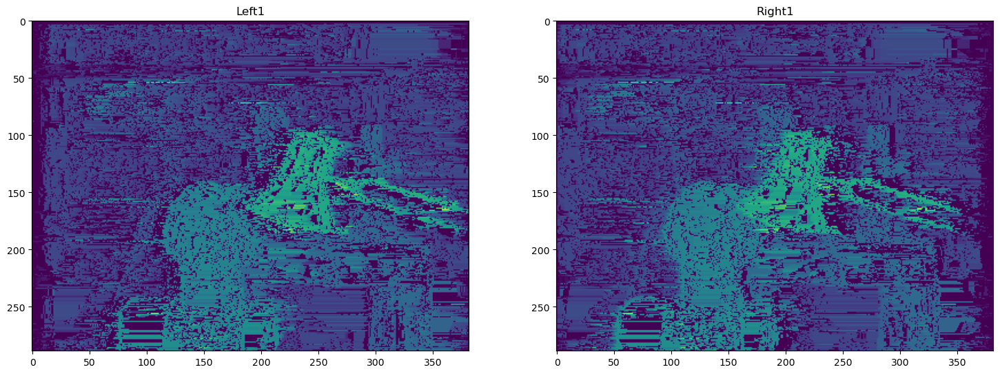

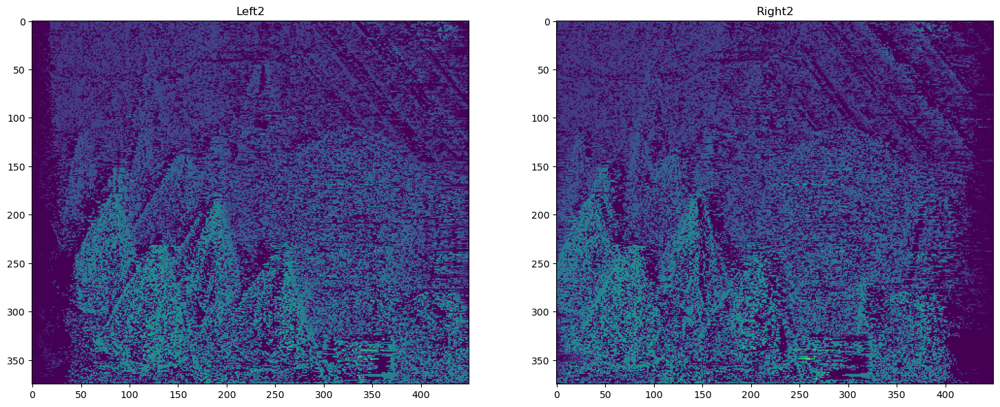

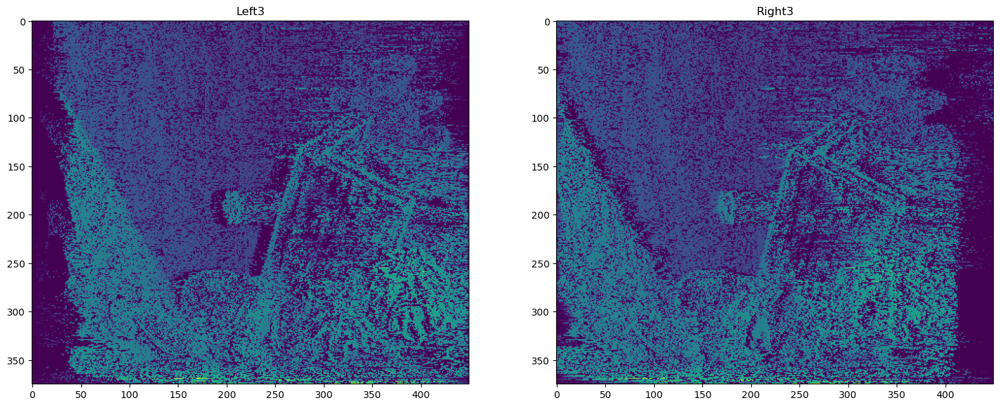

(<Figure size 1800x800 with 2 Axes>,
 <AxesSubplot: title={'center': 'Left3'}>,
 Text(0.5, 1.0, 'Left3'),
 <AxesSubplot: title={'center': 'Right3'}>,
 Text(0.5, 1.0, 'Right3'),
 None)

In [77]:
plt.figure(figsize=(18,8)),plt.subplot(1,2,1),plt.title('Left1'),plt.imshow(disp_left1),plt.subplot(1,2,2),plt.title('Right1'),plt.imshow(disp_right1),plt.show()
plt.figure(figsize=(18,8)),plt.subplot(1,2,1),plt.title('Left2'),plt.imshow(disp_left2),plt.subplot(1,2,2),plt.title('Right2'),plt.imshow(disp_right2),plt.show()
plt.figure(figsize=(18,8)),plt.subplot(1,2,1),plt.title('Left3'),plt.imshow(disp_left3),plt.subplot(1,2,2),plt.title('Right3'),plt.imshow(disp_right3),plt.show()

